[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Ken-Lau-Lab/MILWRM/blob/main/tutorials/MILWRM_tutorial_mxif.ipynb)

Data to run this notebook can be downloaded from https://zenodo.org/records/10557593

In [1]:
import MILWRM as mw
import glob as glob
import pandas as pd
import matplotlib.pyplot as plt
import re

In [12]:
import pathlib
from pyometiff import OMETIFFReader

## Reading in images

The first two steps of preprocessing i.e., scaling and downsampling are performed separately. Each image is read into an npz object, scaled and downsampled. If required, a tissue mask is created. The mean estimator is mean of pixel intensities in that image for all markers multiplied with number of pixels in that image. This is used for the calculation of mean across a batch of samples for log normalization. This scaled, downsampled npz object is stored and the path to this object, batch, mean_estimator and number of pixels is returned to be stored in a dataframe. 

There are two ways one can use MILWRM - first is to open images -> preprocess -> save npz object and use the path to this npz object as input to MILWRM or open images -> preprocess -> perform MILWRM on the images in python notebook directly. We recommend using the first method since images are big files and this way MILWRM can be done several samples together.  It also saves computational resources and time since preprocessed images can be used several times with different MILWRM parameters. 
following is an example of files can be preprocessed using the above function.

In [14]:
def read_ome_tiff(path_to_file, markers):
    """
    This function is an example function to read ome tiffs
    
    Parameter
    ---------
    path_to_file : str
        Path to ome tiff
    markers : list
        marker for each image slice
    
    Returns 
    -------
    mw_img : MILWRM.MxIF.img
        npz img object with image and marker information stored
    """
    reader = OMETIFFReader(fpath=path_to_file)
    img_array, metadata, xml_metadata = reader.read()
    plt.imshow(img_array[0,:,:]) # just checking image here
    temp = np.swapaxes(img_array, 0,2) # reshaping image from C,Y,X to X,Y,C
    img_array2 = np.swapaxes(temp,0,1)
    mw_img = mw.MxIF.img.from_img_array(img_array2,markers, mask = None)
    mw_img.scale() # scaling pixel intensities to 0,1
    mw_img.downsample(fact = 8) # downsampling images by a factor of 8
    mw_img.create_tissue_mask() # creating tissue mask
    return mw_img

In [ ]:
for i in glob.glob('/media/disk2/Lymph_node/*/image.ome.tif'):
    file_name = i.split('/')[-2]
    path_to_file = i
    df = pd.read_csv('/media/disk2/Lymph_node/'+ file_name + '/markers.csv')
    ## extracting marker names
    if df['marker_name'].str.contains('reg').all():
        markers = [re.search(r'reg\d\d\d_cyc\d\d\d_ch\d\d\d_(.*)\.tif',x).group(1) for x in df['marker_name'].values]
    else:
        markers = list(df['marker_name'].values)
    mw_img = read_ome_tiff(path_to_file, markers)
    mw_img.to_npz('/media/disk2/Lymph_node/' + file_name + '.npz')
    a = mw_img.show(cbar = True)

In [16]:
# define a dataframe to store the MILWRM img objects, batches, mean estimators and pixel size of the image
image_df = pd.DataFrame(columns = ['Img', 'batch_names', 'mean estimators', 'pixels'])
for i in glob.glob('/media/disk2/Lymph_node/Lymph_node_npz/*.npz'):
    img = mw.MxIF.img.from_npz(i) ## load imnage from npz
    mean, pixels = img.calculate_non_zero_mean() # calculate mean and pixel size
    batch_name = i.split('/')[-1] # get the batch name
    # batch_name = 'Lymph_node' # you can set the same batch name for all images
    df = pd.DataFrame([img,batch_name,mean,pixels]).T
    df.columns = ['Img', 'batch_names', 'mean estimators', 'pixels']
    image_df = pd.concat([image_df,df], ignore_index= True)

Loading img object from /media/disk2/Lymph_node/Lymph_node_npz/1moWT_2LNig_M_D1a_630AA-1.npz...
Loading img object from /media/disk2/Lymph_node/Lymph_node_npz/1moWT_2LNig_F_D1a_608F-1_3.npz...
Loading img object from /media/disk2/Lymph_node/Lymph_node_npz/1moWT_LN_F_D1a_602E2-4.npz...


## let us see what image_df looks like
as shown it contains img objects stored img column, batch names, mean estimators and pixel size of the downsampled image. 

In [17]:
image_df

,Img,batch_names,mean estimators,pixels
0,img object with <class 'numpy.ndarray'> of flo...,1moWT_2LNig_M_D1a_630AA-1.npz,"[547304.3790066842, 632552.4147490262, 4986.03...",28012708
1,img object with <class 'numpy.ndarray'> of flo...,1moWT_2LNig_F_D1a_608F-1_3.npz,"[493558.5828115743, 561550.7552991481, 4433.19...",19453748
2,img object with <class 'numpy.ndarray'> of flo...,1moWT_LN_F_D1a_602E2-4.npz,"[388095.2052578403, 3557.580410530666, 5122.45...",8200133


Markers to perform clustering for tissue domain identification should be chosen carefully as some markers are more functional and
contain less information about spatial structure of the tissue. 

In [15]:
clustermarkers = ['CD11c',
 'Foxp3',
 'XCR1',
'Collagen_IV',
 'CD21-35',
 'CD11b',
 'CD3',
 'CD4',
 'PDGFRb',
    'Siglec-1',
 'CD8',
 'Sirpa',
'Lyve-1',
 'CD44',
 'B220',
 'Ly6G',
 'CD31',
 'CD25',
]

### Creating the tissue labeler object

In [19]:
%time tl = mw.mxif_labeler(image_df)

CPU times: user 1.14 ms, sys: 0 ns, total: 1.14 ms
Wall time: 1.16 ms


### preparing data for clustering

In [20]:
%time tl.prep_cluster_data(clustermarkers)

Applying gaussian filter
Applying gaussian filter
Applying gaussian filter
CPU times: user 3.72 s, sys: 179 ms, total: 3.89 s
Wall time: 4.05 s


### Performing tissue domain identifcation
alpha is a parameter that can be changed to control the number of tissue domains identified. 
Its value goes upto 0.05 which results in low number of tissue domains. For higher resolution clustering alpha value can be reduced. 

Determining optimal cluster number k via scaled inertia


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 48 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  19 | elapsed:   13.5s remaining:  1.9min
[Parallel(n_jobs=-1)]: Done   4 out of  19 | elapsed:   22.8s remaining:  1.4min
[Parallel(n_jobs=-1)]: Done   6 out of  19 | elapsed:   26.4s remaining:   57.2s
[Parallel(n_jobs=-1)]: Done   8 out of  19 | elapsed:   26.7s remaining:   36.7s
[Parallel(n_jobs=-1)]: Done  10 out of  19 | elapsed:   27.7s remaining:   25.0s
[Parallel(n_jobs=-1)]: Done  12 out of  19 | elapsed:   31.1s remaining:   18.1s
[Parallel(n_jobs=-1)]: Done  14 out of  19 | elapsed:   34.9s remaining:   12.5s
[Parallel(n_jobs=-1)]: Done  16 out of  19 | elapsed:   38.8s remaining:    7.3s
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:   43.1s finished
findfont: Font family ['sans.serif'] not found. Falling back to DejaVu Sans.


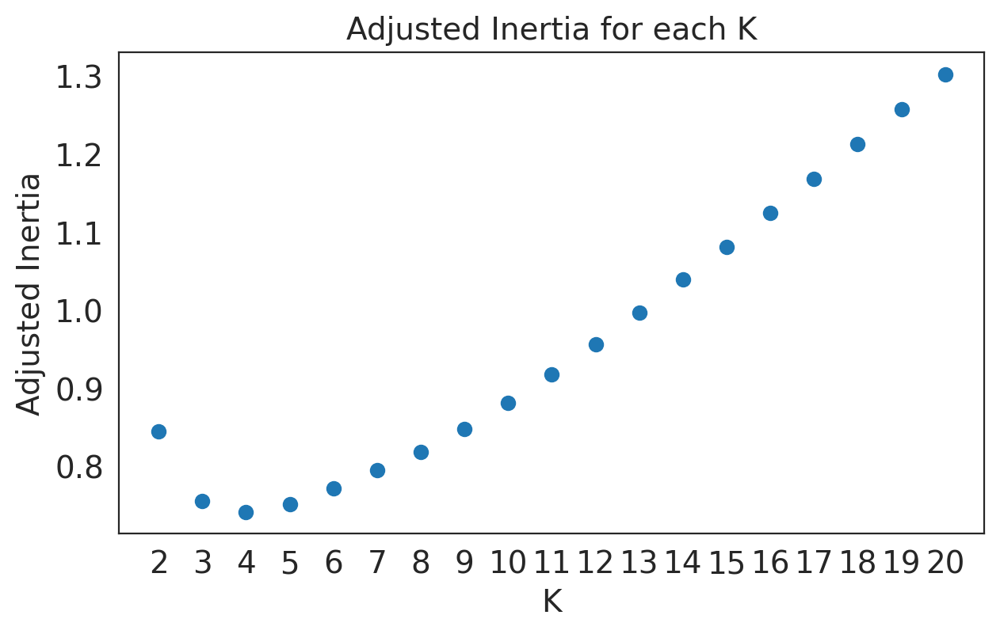

The optimal number of clusters is 4
Performing k-means clustering with 4 target clusters
Creating tissue_ID images for image objects...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 48 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    7.3s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    7.3s finished


In [21]:
tl.label_tissue_regions(alpha = 0.05)

## Visualization

#### visualizing tissue domains on the tissue

findfont: Font family ['sans.serif'] not found. Falling back to DejaVu Sans.


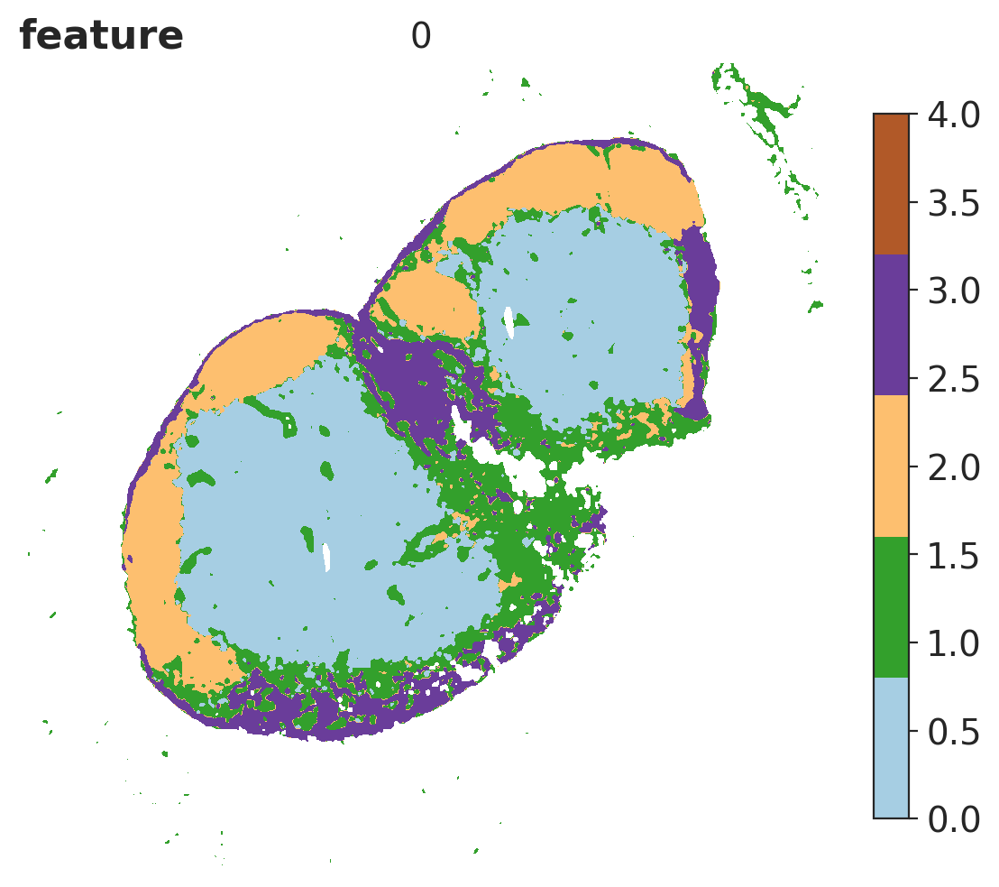

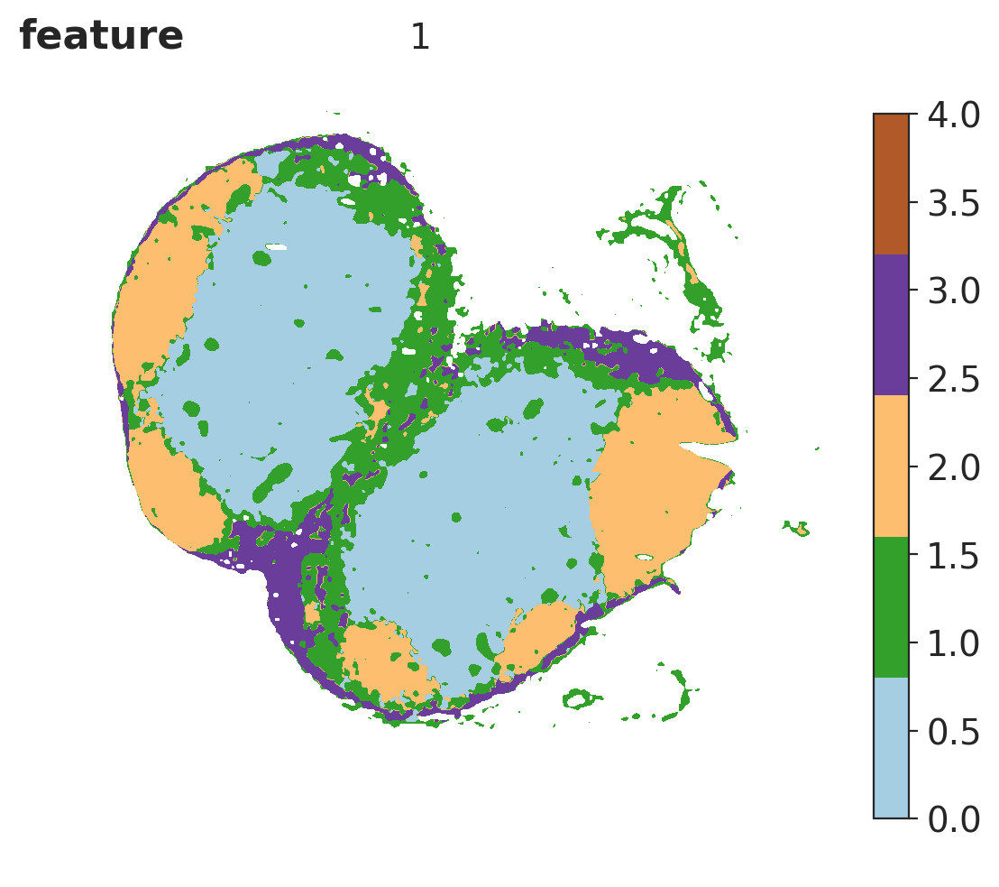

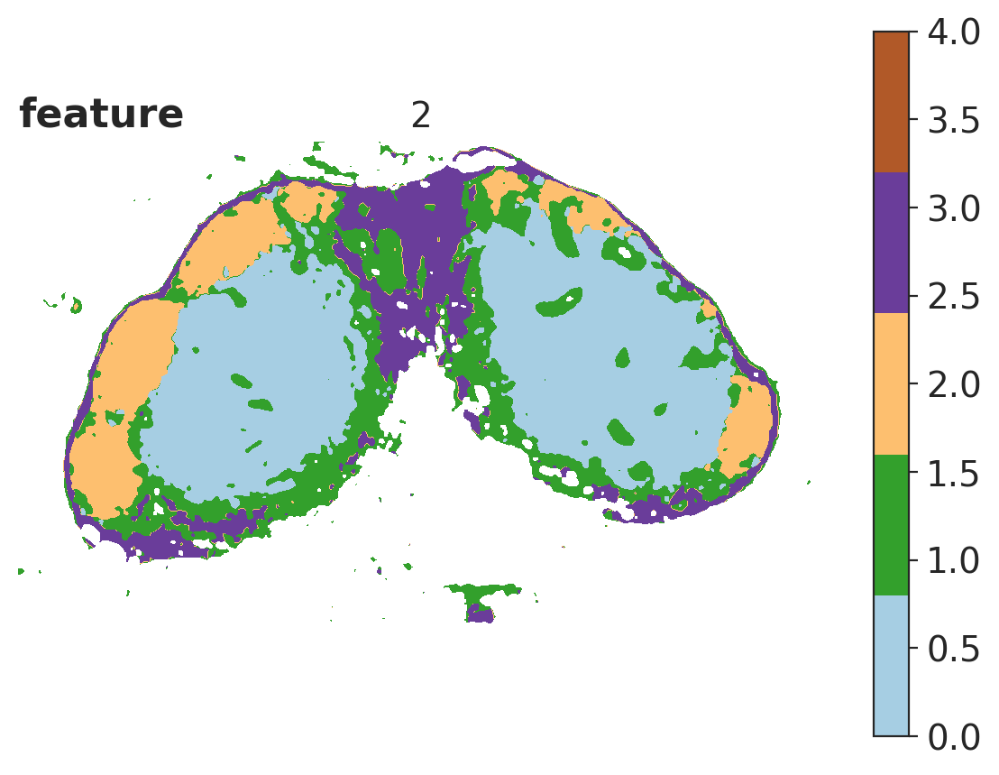

In [22]:
for i, tID in enumerate( tl.tissue_IDs):
    cmap = plt.cm.get_cmap('Paired',5)
    p = mw.show_pita(tID, figsize=(6,6), cmap=cmap, save_to=None, vmin = 0, vmax = 4)
    plt.title(i)

#### visualizing tissue domain profile associated with each tissue domain

findfont: Font family ['sans.serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans.serif'] not found. Falling back to DejaVu Sans.


GridSpec(2, 2)

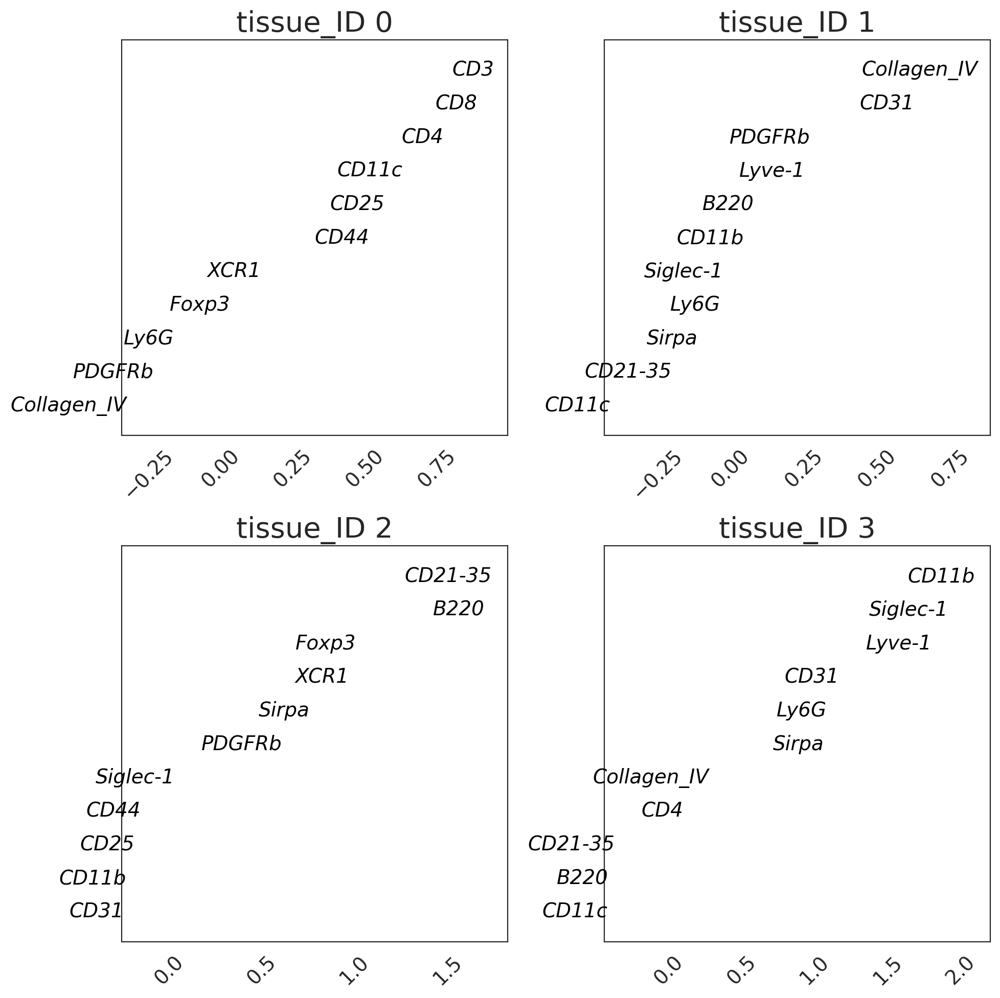

In [23]:
tl.plot_feature_loadings(ncols = 2, nfeatures=10)

### Estimating QC metrics

<Figure size 500x500 with 0 Axes>

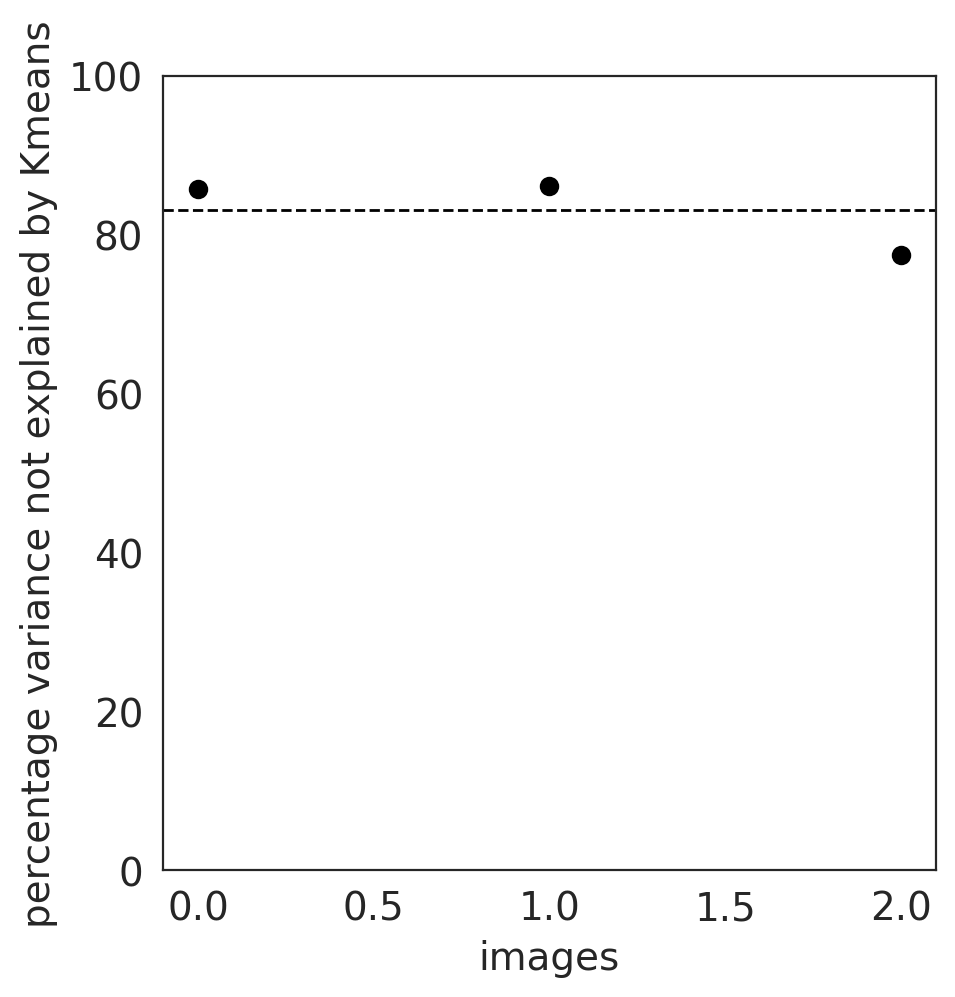

In [24]:
a = tl.plot_percentage_variance_explained(R_square = True)

findfont: Font family ['sans.serif'] not found. Falling back to DejaVu Sans.


<AxesSubplot:xlabel='images', ylabel='tissue domain proportion'>

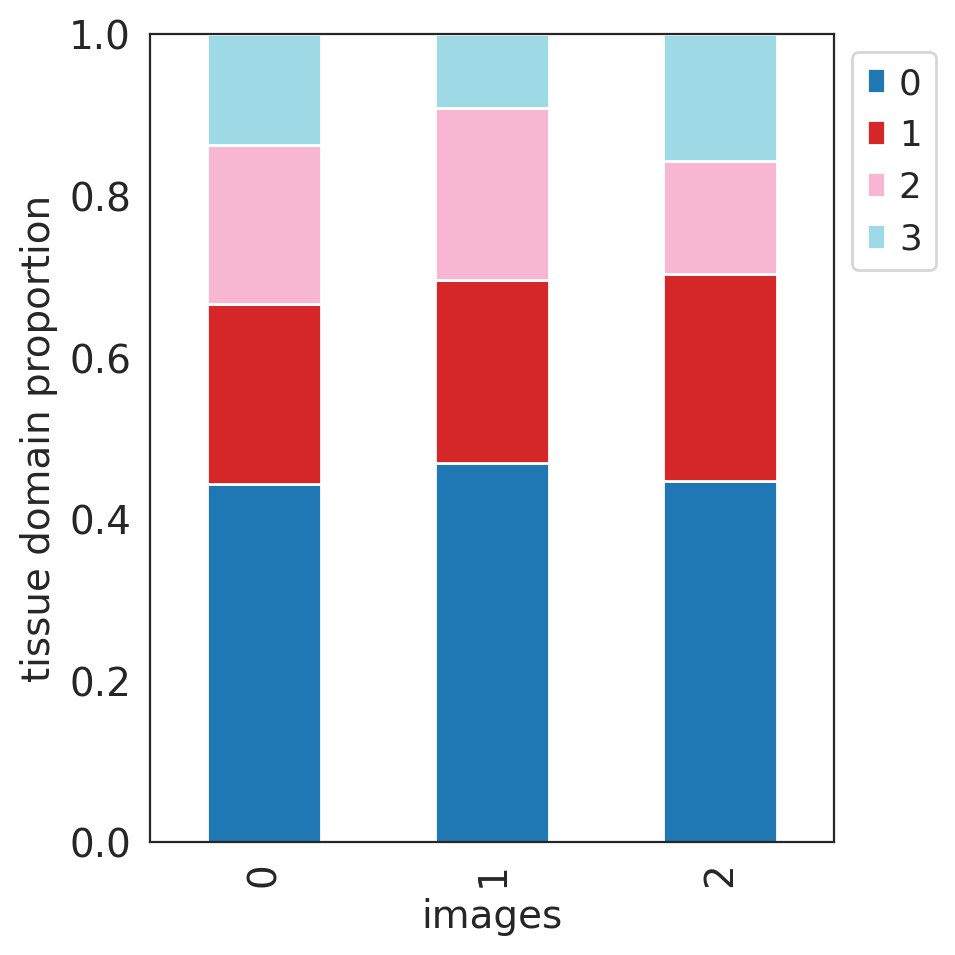

In [25]:
tl.plot_tissue_ID_proportions_mxif()

In [26]:
tl.confidence_score_images()

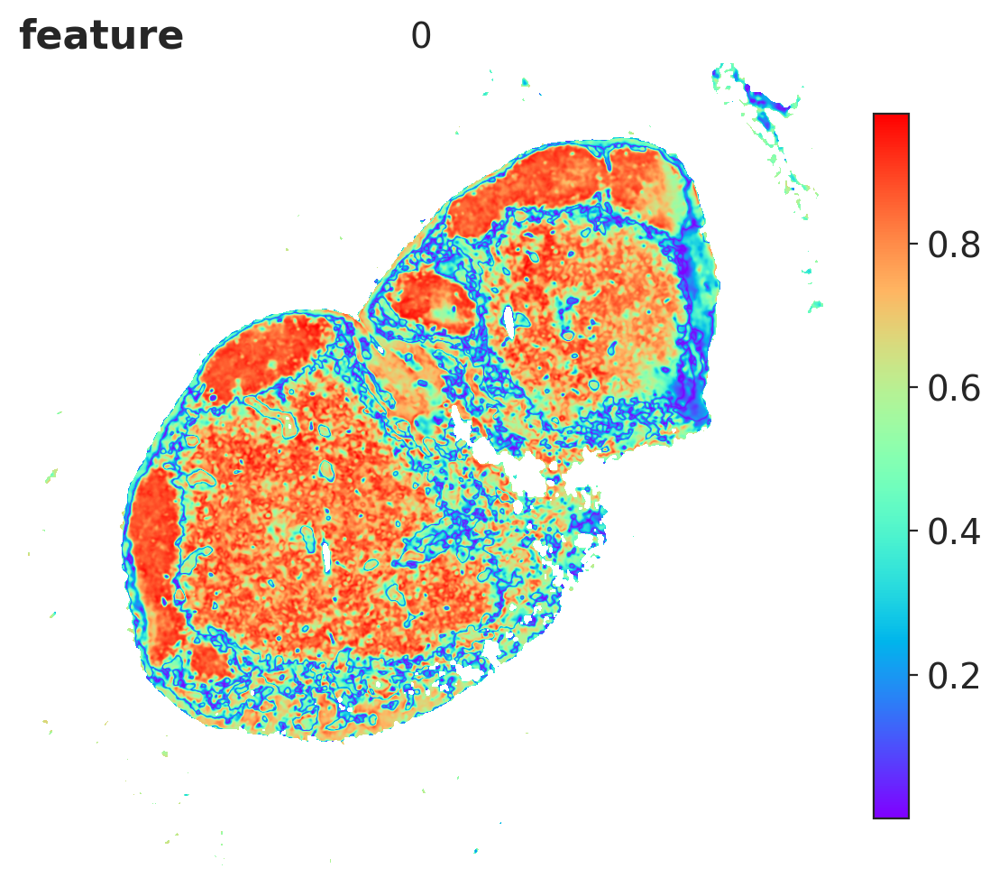

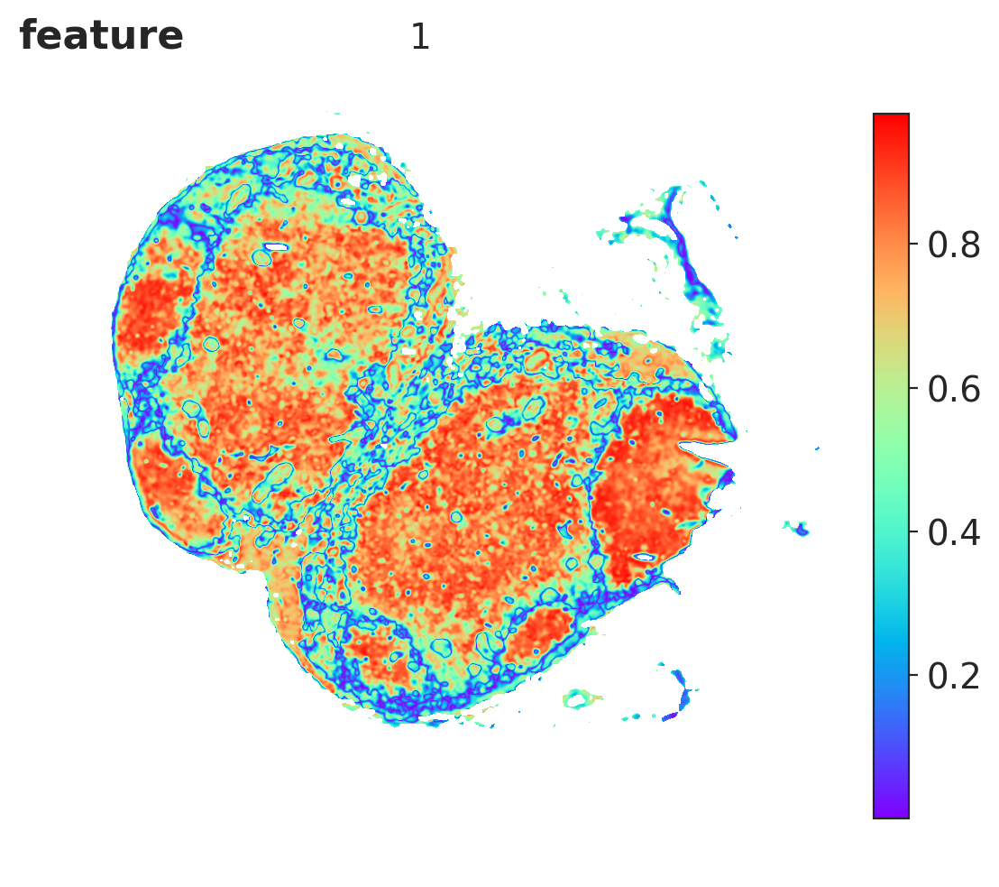

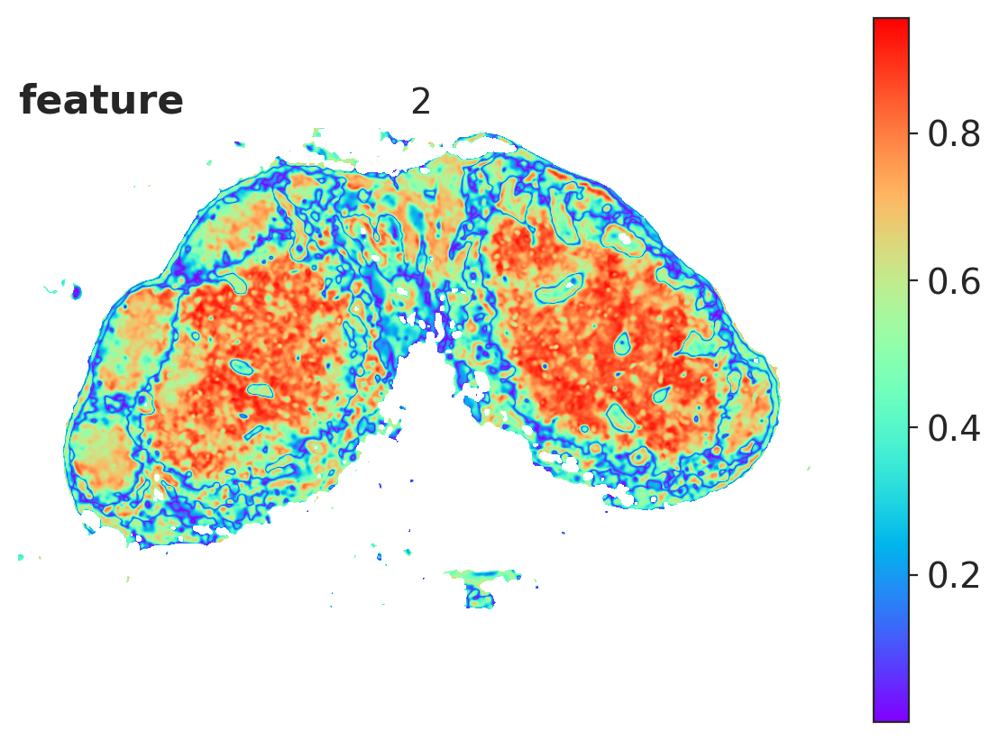

In [28]:
for i, tID in enumerate( tl.confidence_IDs):
    # cmap = plt.for i, tID in enumerate( tl.tissue_IDs):
    p = mw.show_pita(tID, figsize=(6,6), cmap='rainbow')
    plt.title(i)

findfont: Font family ['sans.serif'] not found. Falling back to DejaVu Sans.


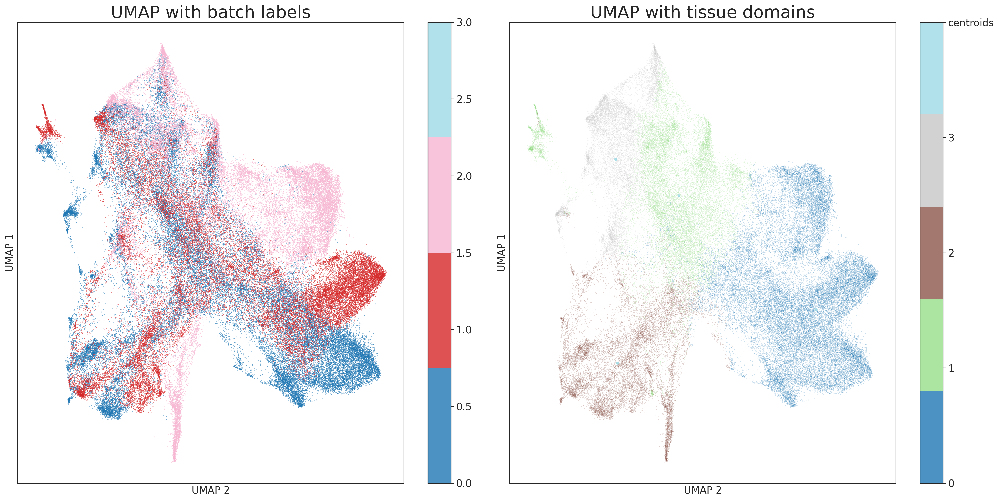

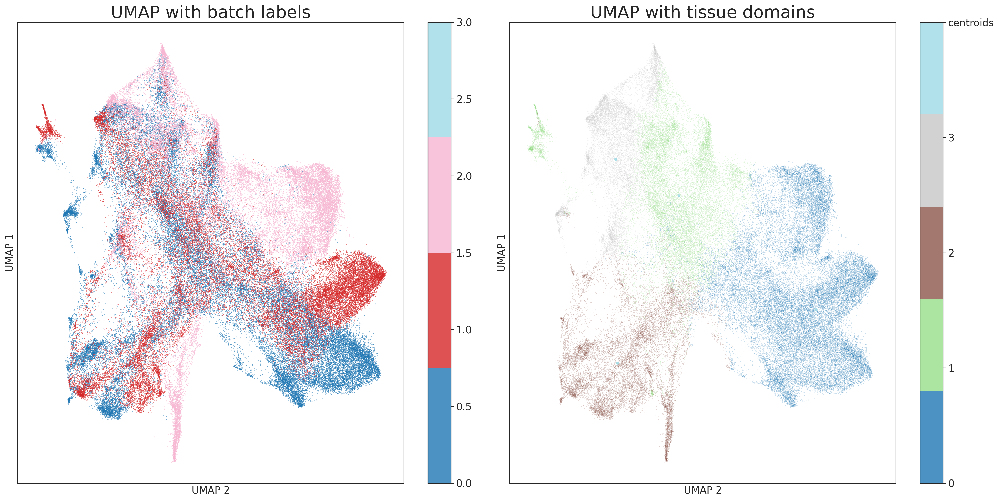

In [29]:
tl.make_umap(frac = 0.5, )